In [1]:
import numpy as np
from dataset_class import setup, label_map, colour_map

/opt/homebrew/Caskroom/miniconda/base/envs/bzzt/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [47]:
dataset, test_data, freq = setup()

generating label counts:: 100%|██████████| 6982/6982 [02:16<00:00, 51.24it/s]


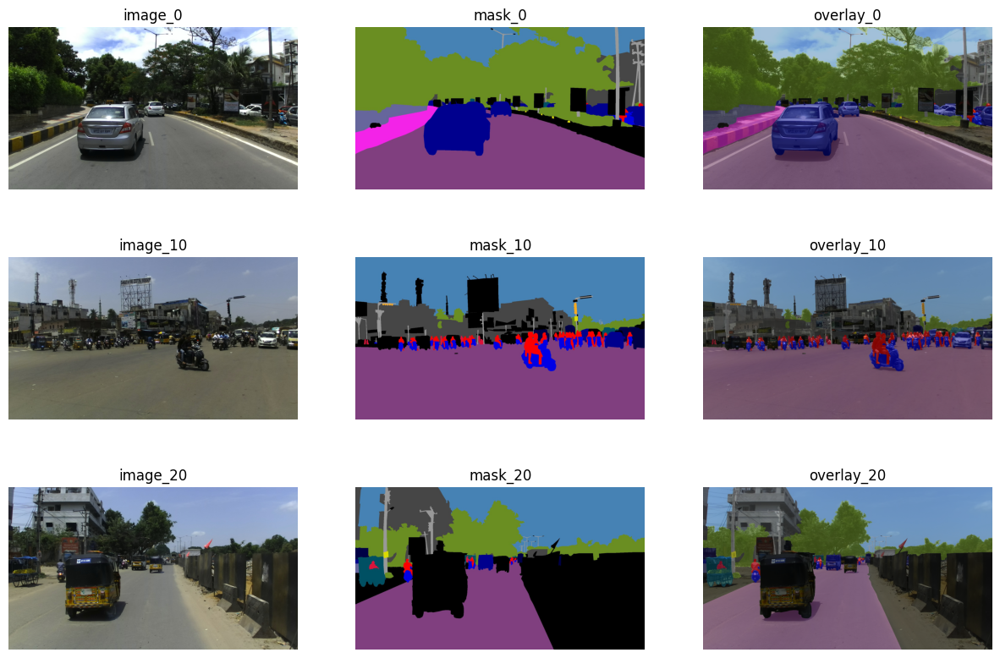

In [48]:
import matplotlib.pyplot as plt

def imshow(dataset):
    num_imgs = 3
    cols = 3
    rows = num_imgs

    plt.figure(figsize=(15, 10))
    for i in range(num_imgs):
        i_c = i*10
        img, mask = dataset.__getitem__(i_c)

        plt.subplot(rows, cols, i * 3 + 1)
        plt.imshow(img)
        plt.title(f'image_{i_c}')
        plt.axis('off')

        plt.subplot(rows, cols, i * 3 + 2)
        plt.imshow(mask)  
        plt.title(f'mask_{i_c}')
        plt.axis('off')

        plt.subplot(rows, cols, i * cols + 3)
        plt.imshow(img)
        plt.imshow(mask, alpha=0.5)
        plt.title(f'overlay_{i_c}')
        plt.axis('off')

    plt.show()
imshow(dataset)


In [49]:
freq_distro = dict(Misc = 0)
act_lbl = set(np.nonzero(freq)[0])

for i in act_lbl:
    if i in label_map.keys():
        val = label_map[i]
        freq_distro[val] = freq[i]
    else:
        freq_distro["Misc"] += freq[i]


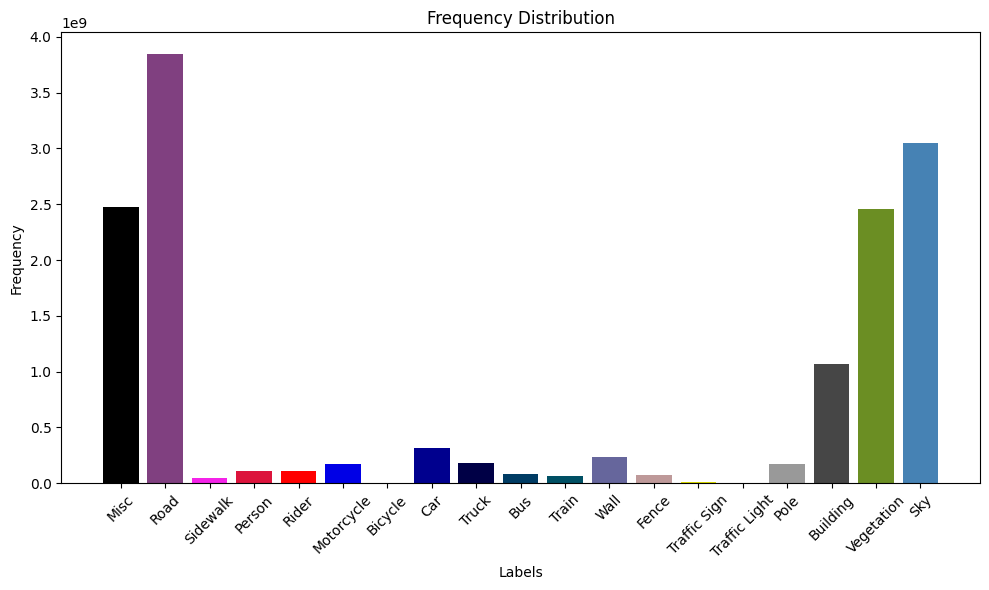

In [50]:
keys = freq_distro.keys()
values = freq_distro.values()

plt.figure(figsize=(10, 6))

rgb_vals = list(colour_map.values())
rgb_vals.insert(0, (0,0,0))
for i, (key, value) in enumerate(zip(keys, values)):
    color = [c / 255. for c in rgb_vals[i]]
    plt.bar(key, value, color=color)

plt.xlabel('Labels')
plt.ylabel('Frequency')
plt.title('Frequency Distribution')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


In [51]:
from gen_res import get_res
res_data = get_res(test_data, "test_data")

In [4]:
from tqdm import tqdm
import pickle
from dataset_class import label_map

labels = label_map.keys()

In [10]:
tp = {}
fp = {}
tn = {}
fn = {}
for key in labels:
    tp[key], fp[key], tn[key], fn[key] = 0, 0, 0, 0

for i in tqdm(range(len(res_data))):
    _, pred_mask = res_data[i]
    _, act_mask = test_data[i]

    pred_mask = np.asarray(pred_mask)
    pred_mask = pred_mask.flatten()

    act_mask = np.asarray(act_mask)
    act_mask = act_mask.flatten()

    for key in labels:
        tp[key] += sum((act_mask[pred_mask == key] == key) == True)
        tn[key] += sum((pred_mask[act_mask != key] != key) == True)
        fp[key] += sum((act_mask[pred_mask == key] != key) == True)
        fn[key] += sum((pred_mask[act_mask == key] != key) == True)


  0%|          | 0/2095 [00:00<?, ?it/s]

100%|██████████| 2095/2095 [13:40<00:00,  2.55it/s]


In [5]:

with open('metrics_data.pickle', 'wb') as file:
    metrics_data = {'tp': tp, 'tn': tn, 'fp': fp, 'fn': fn}
    pickle.dump(metrics_data, file)

In [2]:
with open('metrics_data.pickle', 'rb') as file:
    metrics_data = pickle.load(file)

tp = metrics_data['tp']
tn = metrics_data['tn']
fp = metrics_data['fp']
fn = metrics_data['fn']

In [54]:
iou = {}
pixel_accuracy = {}
dice_coeff = {}
precision = {}
recall = {}
f1_score = {}

for key in labels:
    # IoU
    iou_val = (tp[key]) / (tp[key] + fp[key] + fn[key])
    iou[key] = iou_val

    # Pixel Accuracy
    pix_val = (tp[key]) / (tp[key] + fp[key] + fn[key])
    pixel_accuracy[key] = pix_val

    # Dice Coefficient
    dice_val = (2*tp[key]) / (2*tp[key] + fp[key] + fn[key])
    dice_coeff[key] = dice_val

    # Precision
    if tp[key] + fp[key] == 0:
        precision[key] = 0
    else:
        precision[key] = tp[key] / (tp[key] + fp[key])

    # Recall
    if tp[key] + fn[key] == 0:
        recall[key] = 0
    else:
        recall[key] = tp[key] / (tp[key] + fn[key])

    # F1 Score
    if precision[key] + recall[key] == 0:
        f1_score[key] = 0
    else:
        f1_score[key] = 2 * (precision[key] * recall[key]) / (precision[key] + recall[key])


In [55]:
print("Class-wise Evaluation Metrics:")
print("--------------------------------")

for key in labels:
    print(f"Class: {label_map[key]}")
    print(f"IoU: {iou[key]:.1f}")
    print(f"Pixel Accuracy: {pixel_accuracy[key]:.2f}")
    print(f"Dice Coefficient: {dice_coeff[key]:.2f}")
    print(f"Precision: {precision[key]:.2f}")
    print(f"Recall: {recall[key]:.2f}")
    print(f"F1 Score: {f1_score[key]:.2f}")
    print("---------")


Class-wise Evaluation Metrics:
--------------------------------
Class: Road
IoU: 0.7
Pixel Accuracy: 0.75
Dice Coefficient: 0.86
Precision: 0.77
Recall: 0.97
F1 Score: 0.86
---------
Class: Sidewalk
IoU: 0.1
Pixel Accuracy: 0.09
Dice Coefficient: 0.17
Precision: 0.12
Recall: 0.30
F1 Score: 0.17
---------
Class: Person
IoU: 0.3
Pixel Accuracy: 0.25
Dice Coefficient: 0.40
Precision: 0.34
Recall: 0.51
F1 Score: 0.40
---------
Class: Rider
IoU: 0.3
Pixel Accuracy: 0.27
Dice Coefficient: 0.42
Precision: 0.40
Recall: 0.45
F1 Score: 0.42
---------
Class: Motorcycle
IoU: 0.3
Pixel Accuracy: 0.26
Dice Coefficient: 0.42
Precision: 0.52
Recall: 0.35
F1 Score: 0.42
---------
Class: Bicycle
IoU: 0.0
Pixel Accuracy: 0.04
Dice Coefficient: 0.07
Precision: 0.05
Recall: 0.16
F1 Score: 0.07
---------
Class: Car
IoU: 0.6
Pixel Accuracy: 0.56
Dice Coefficient: 0.71
Precision: 0.64
Recall: 0.80
F1 Score: 0.71
---------
Class: Truck
IoU: 0.2
Pixel Accuracy: 0.21
Dice Coefficient: 0.34
Precision: 0.42
Recall

In [56]:
import matplotlib.pyplot as plt
from dataset_class import tf_mask
from gen_res import gen_colour_masks

Label: Sidewalk


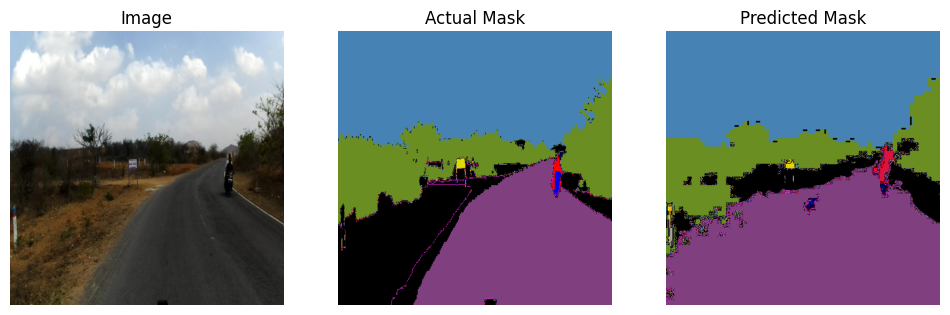

Label: Sidewalk


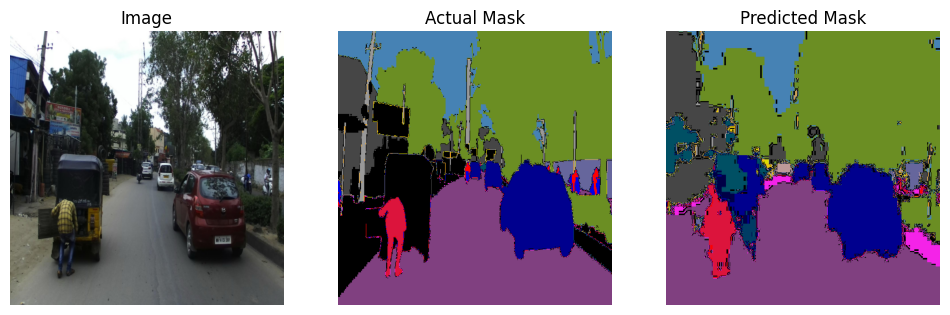

Label: Sidewalk


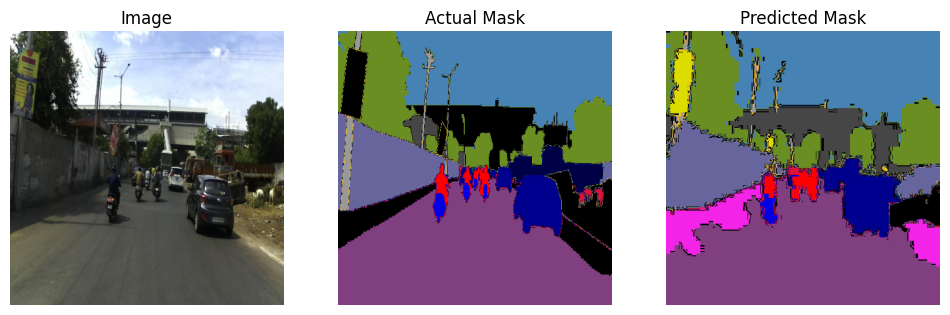

Label: Person


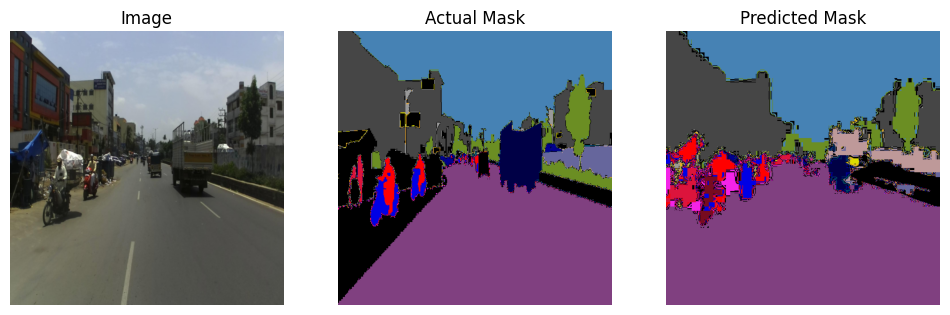

Label: Person


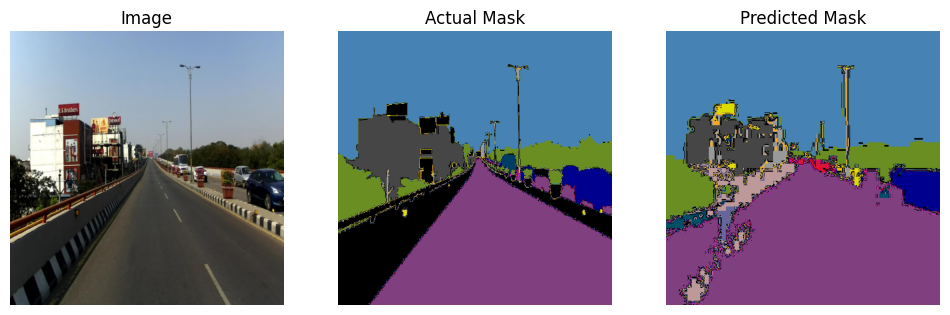

Label: Person


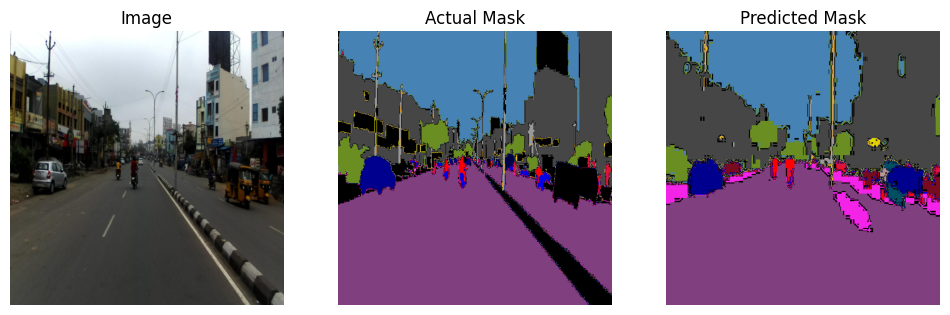

Label: Rider


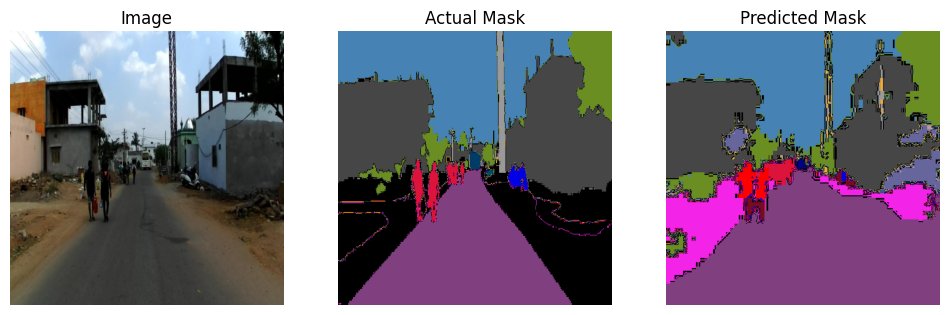

Label: Rider


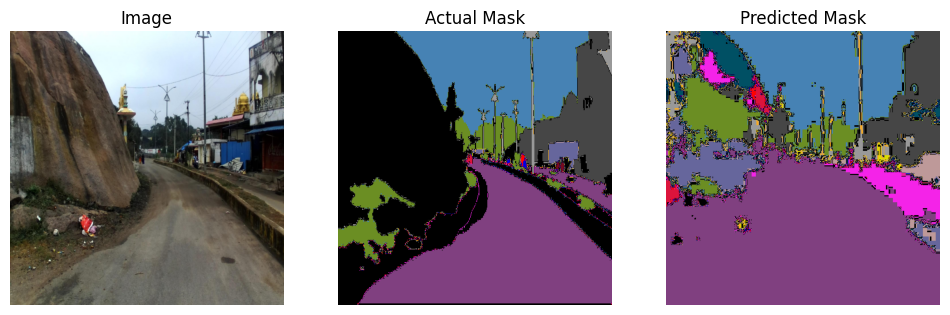

Label: Rider


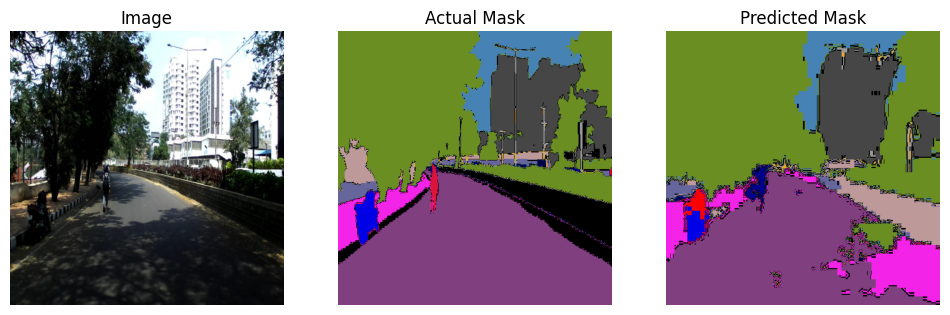

Label: Motorcycle


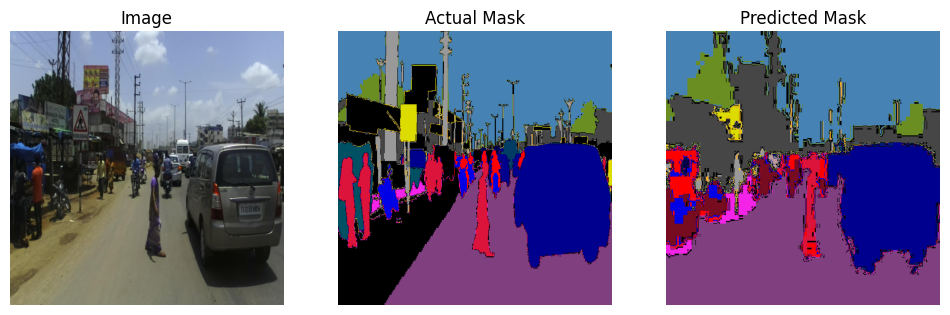

Label: Motorcycle


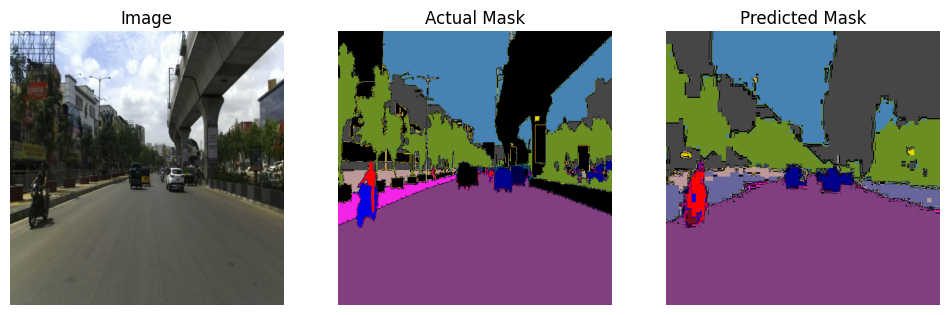

Label: Motorcycle


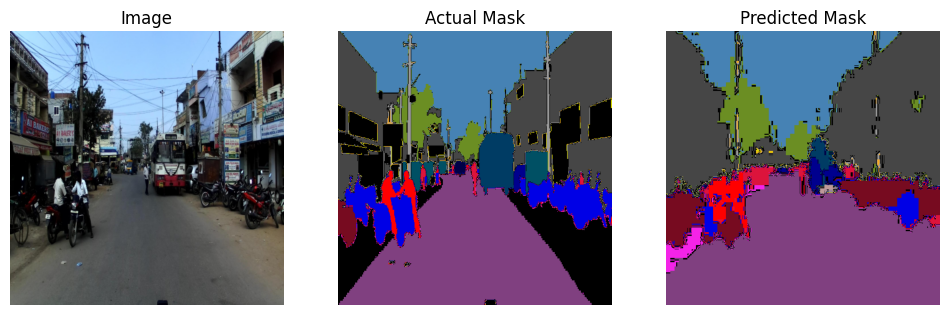

Label: Bicycle


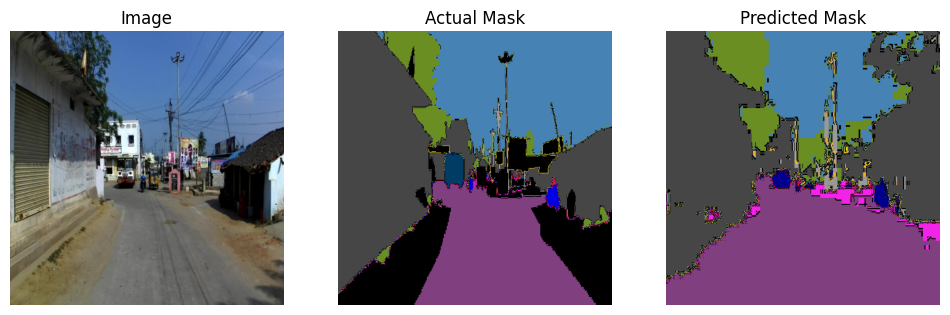

Label: Road


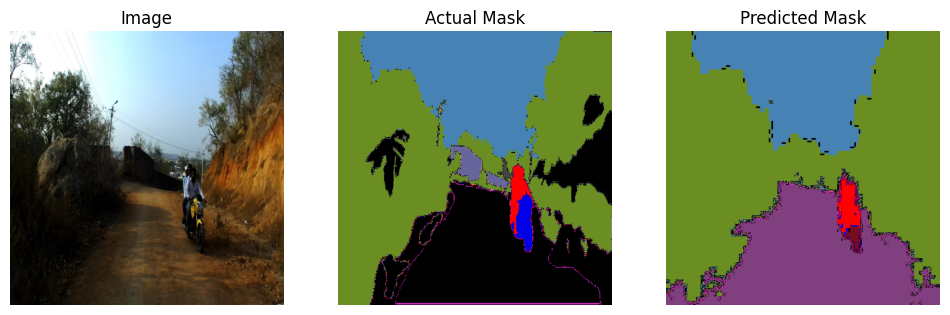

Label: Bicycle


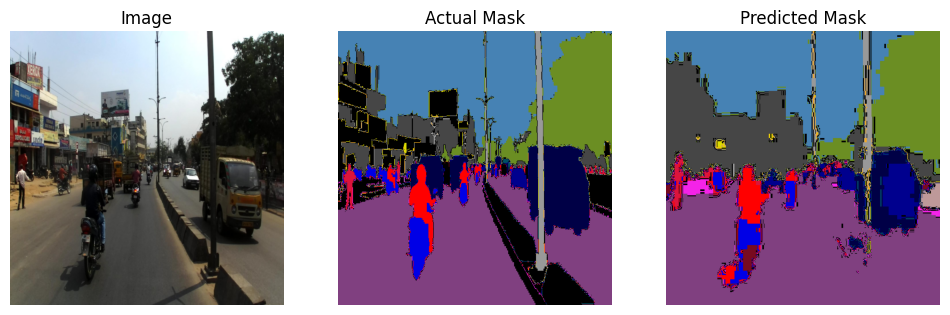

Label: Bicycle


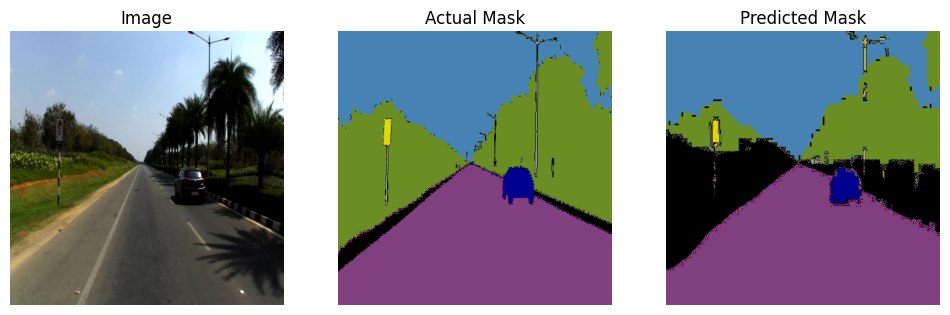

Label: Car


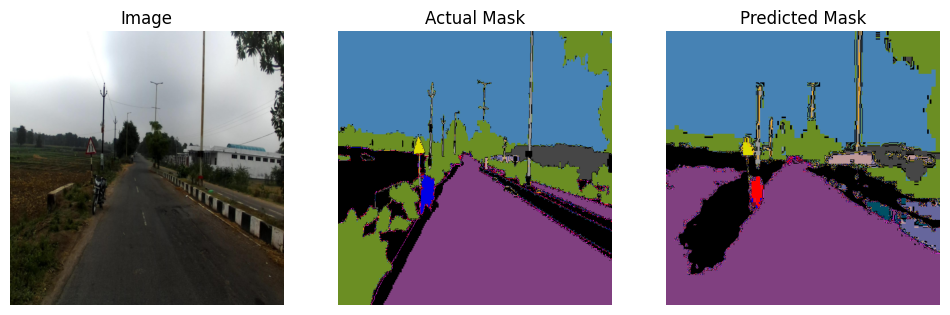

Label: Car


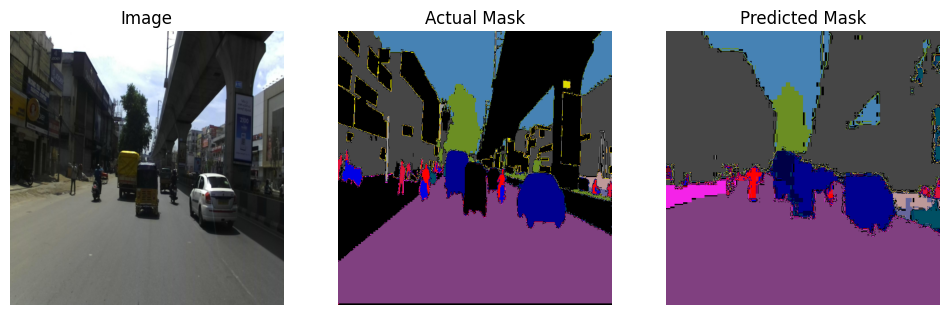

Label: Truck


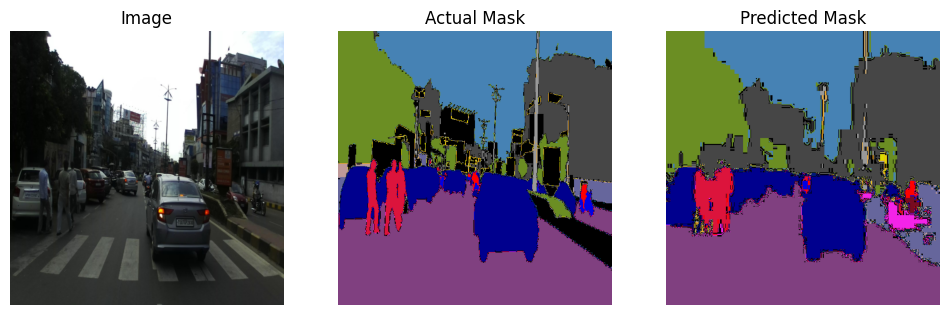

Label: Car


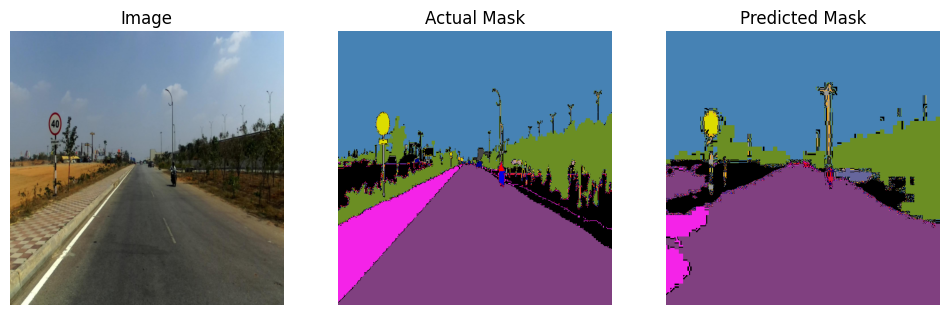

Label: Truck


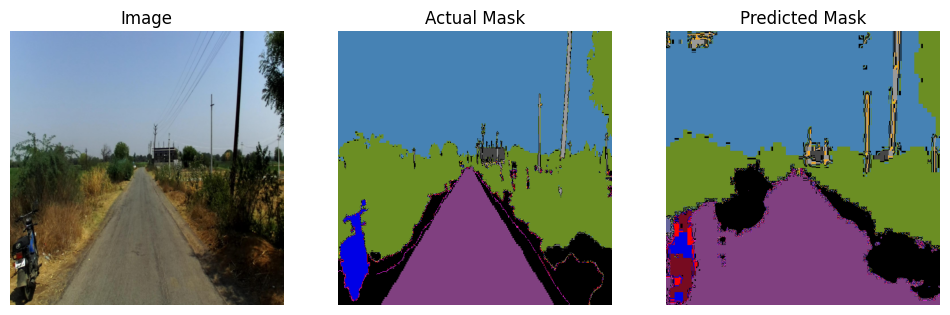

Label: Truck


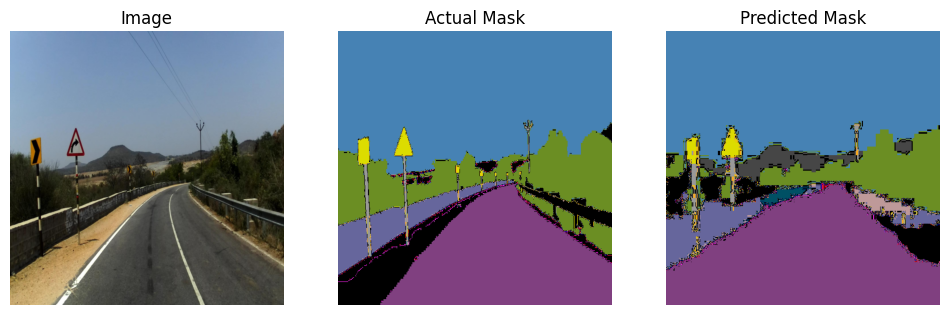

Label: Bus


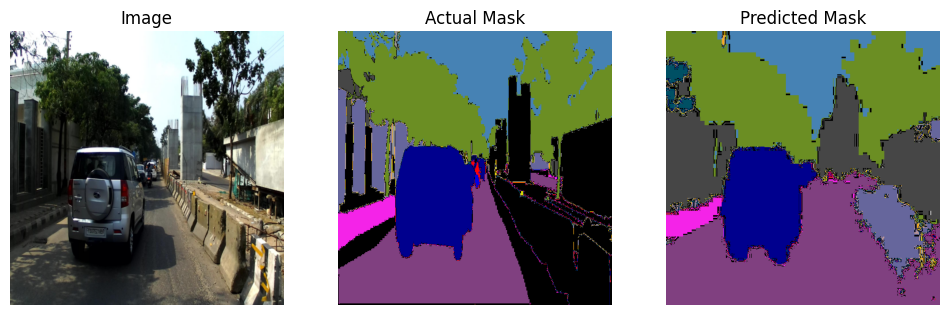

Label: Bus


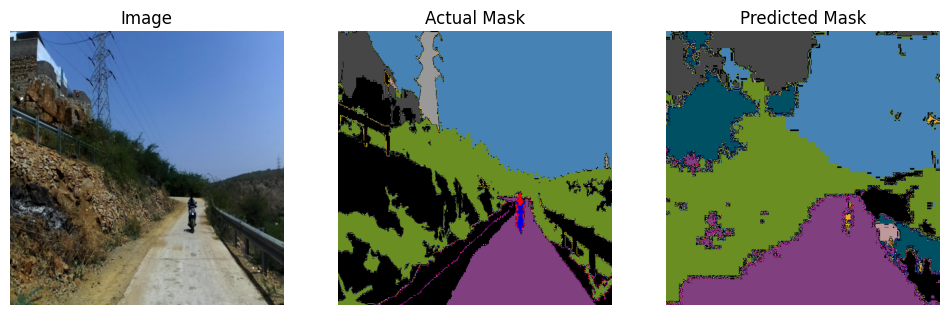

Label: Bus


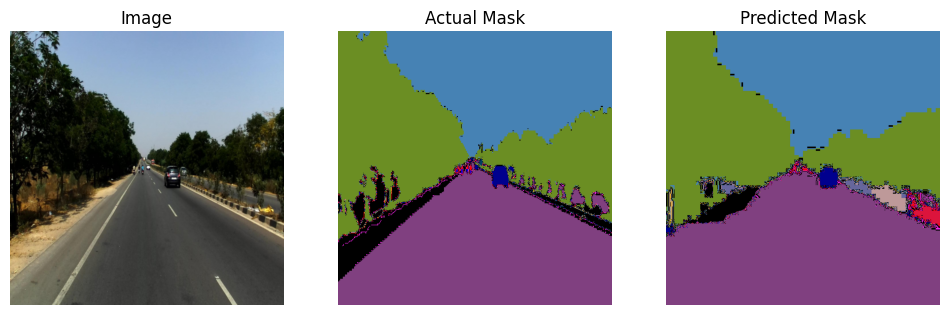

Label: Train


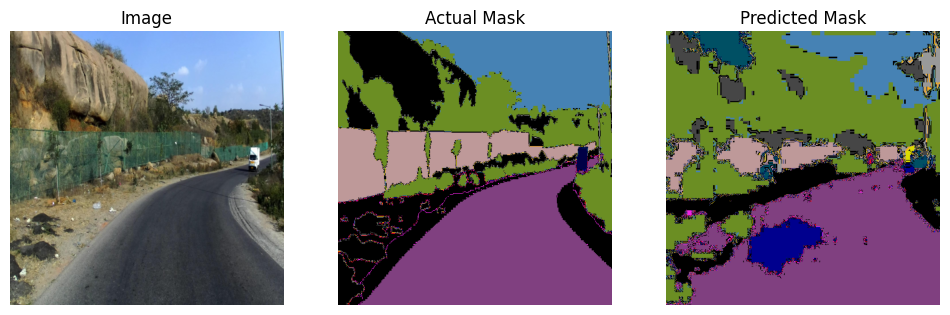

Label: Train


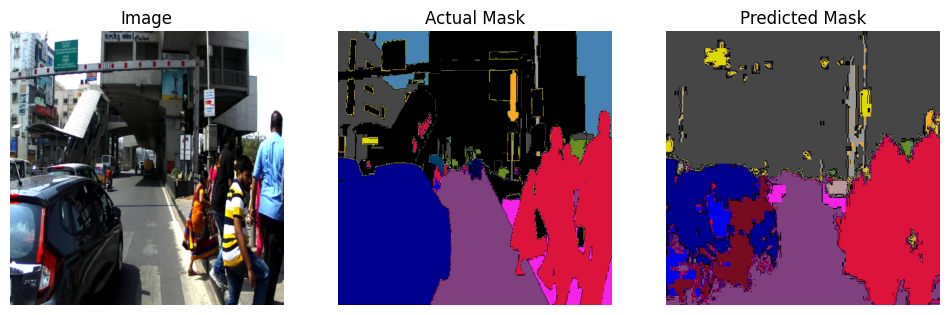

Label: Train


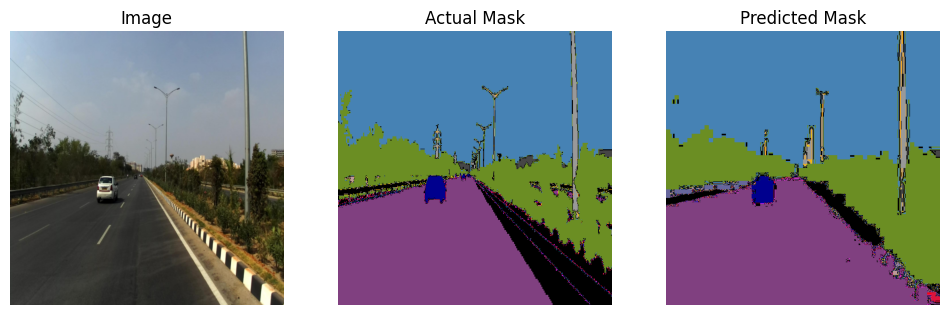

Label: Wall


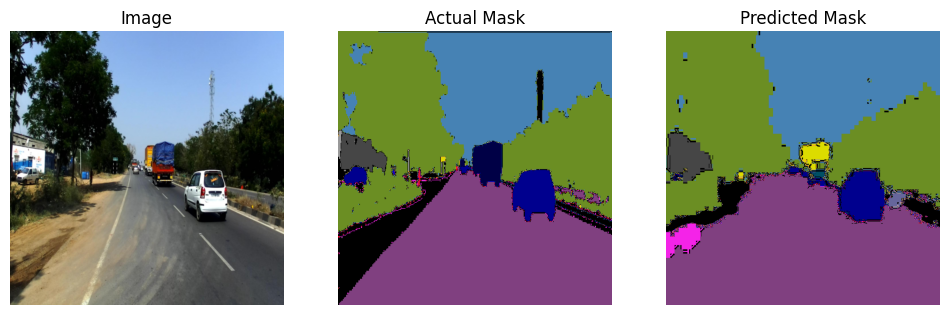

Label: Road


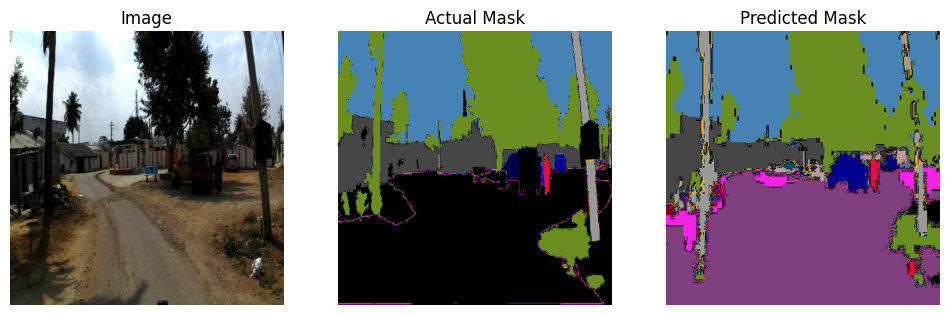

Label: Wall


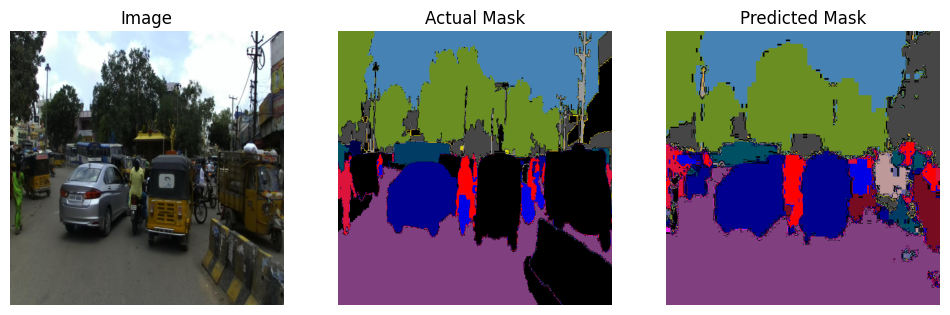

Label: Wall


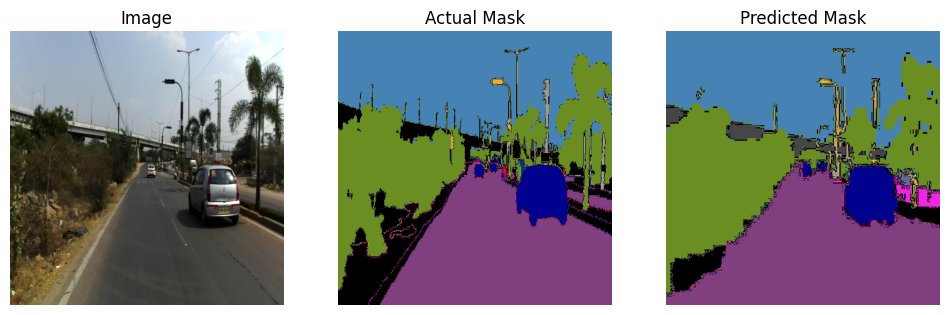

Label: Fence


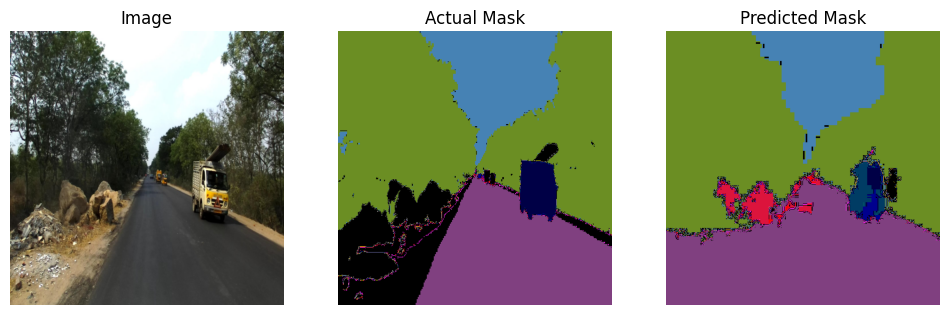

Label: Fence


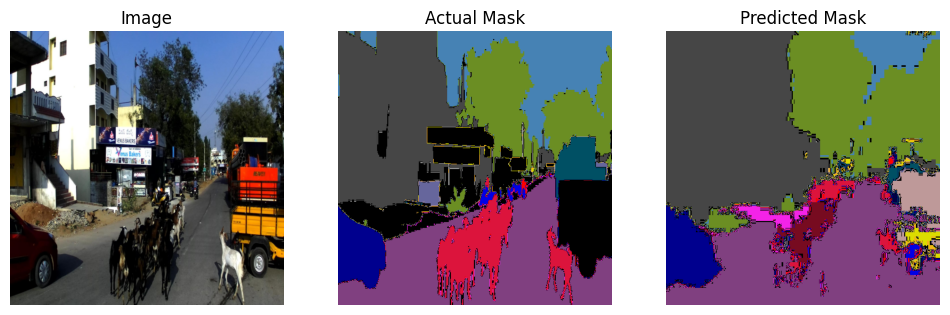

Label: Road


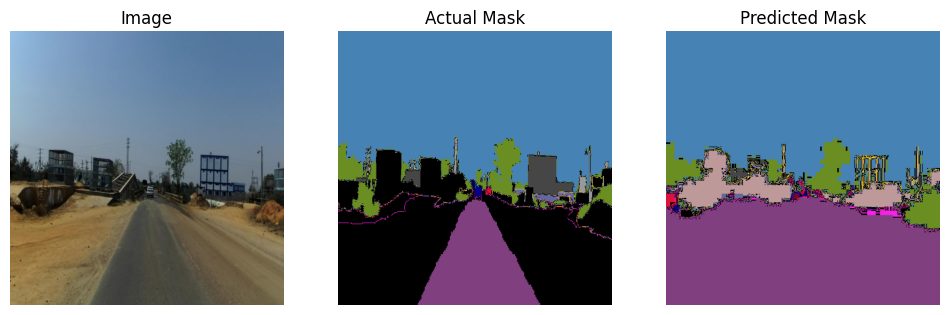

Label: Fence


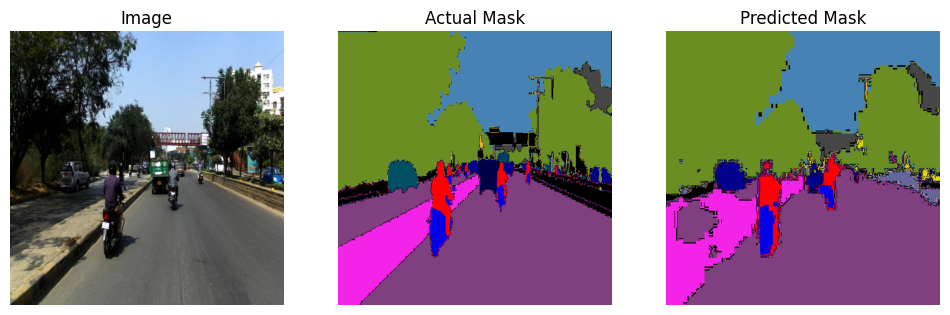

Label: Traffic Sign


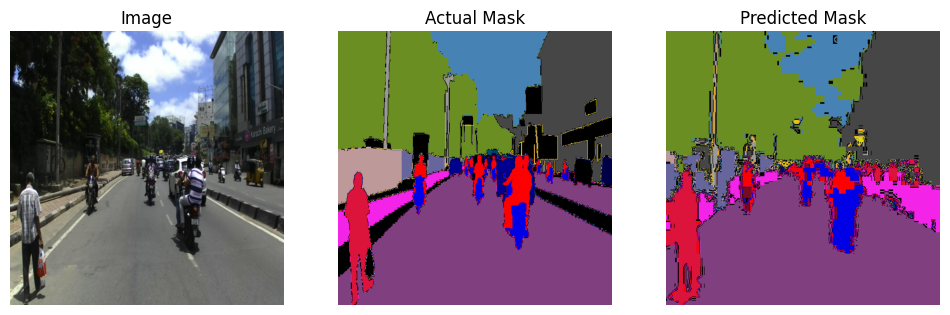

Label: Traffic Sign


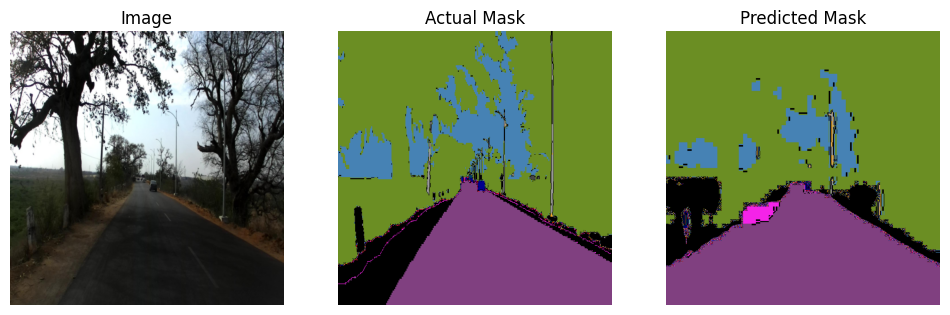

Label: Traffic Sign


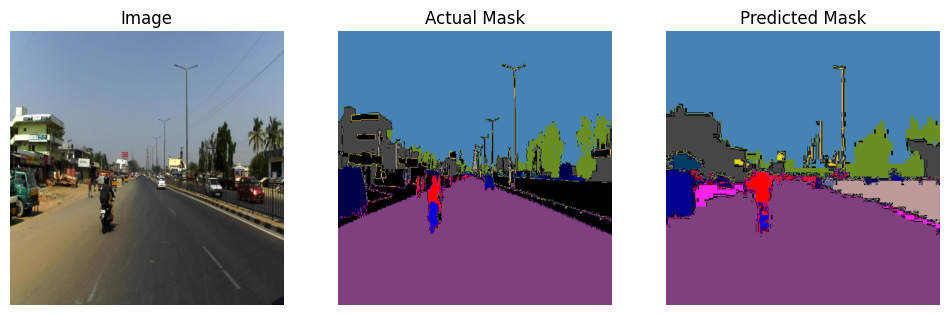

Label: Traffic Light


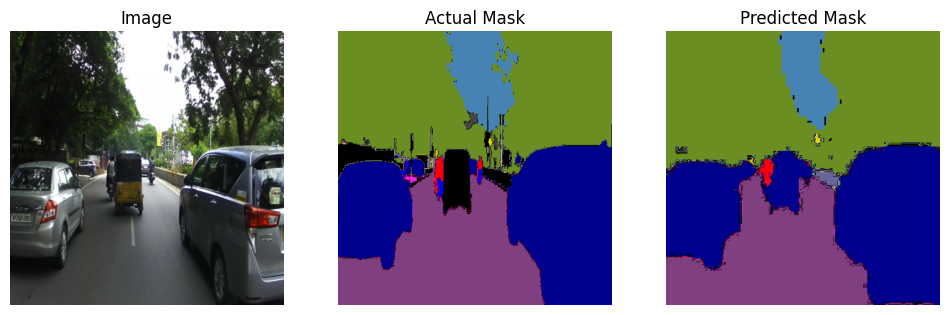

Label: Traffic Light


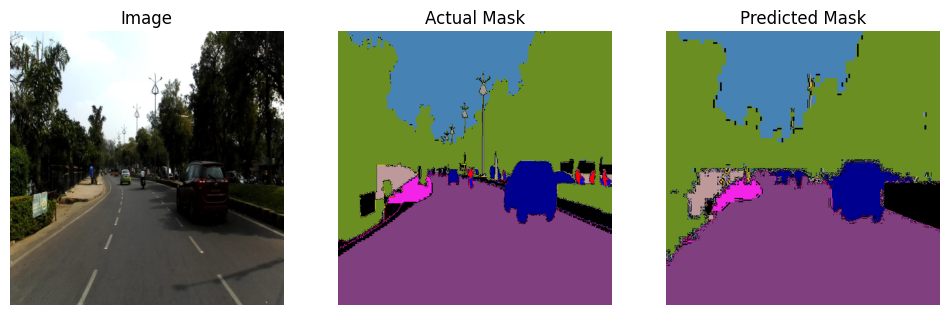

Label: Traffic Light


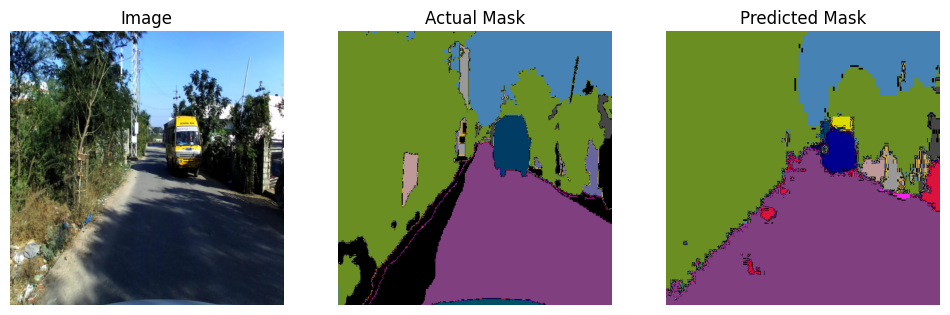

Label: Pole


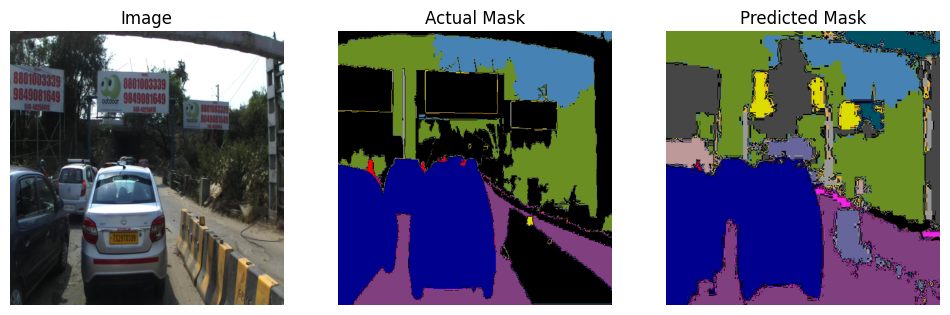

Label: Pole


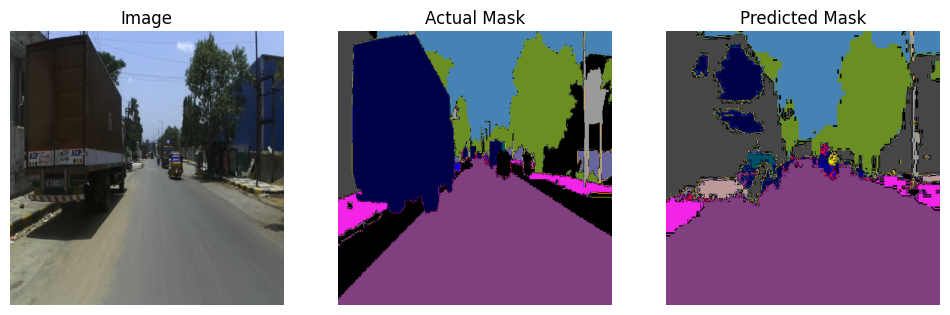

Label: Pole


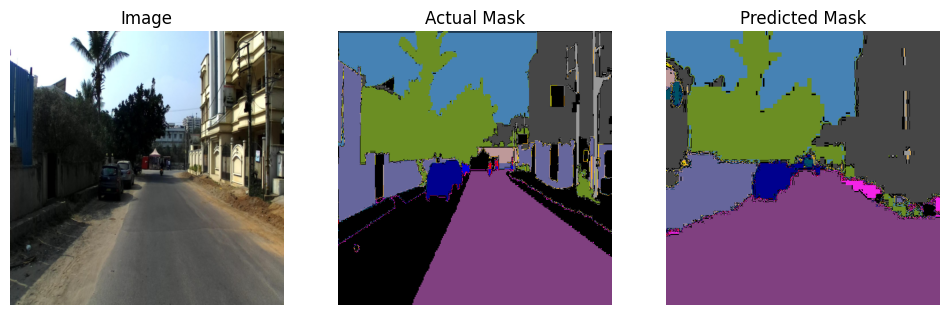

Label: Building


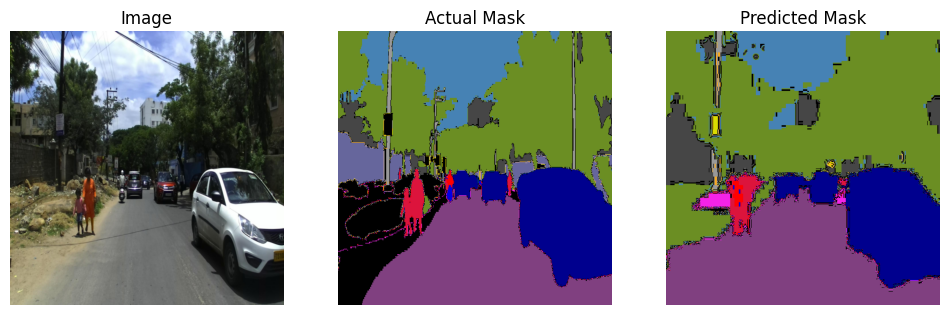

Label: Building


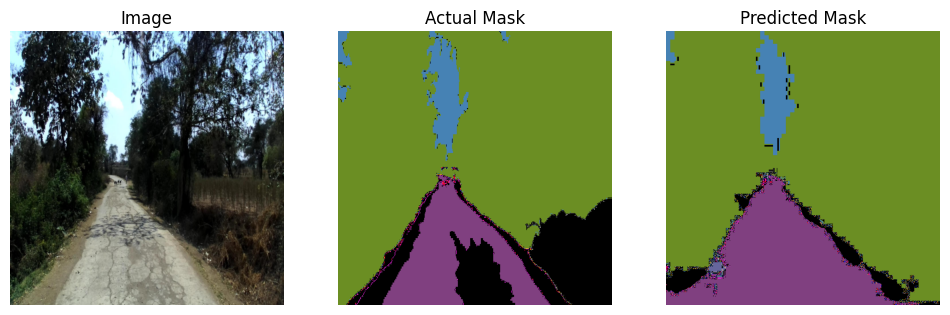

Label: Vegetation


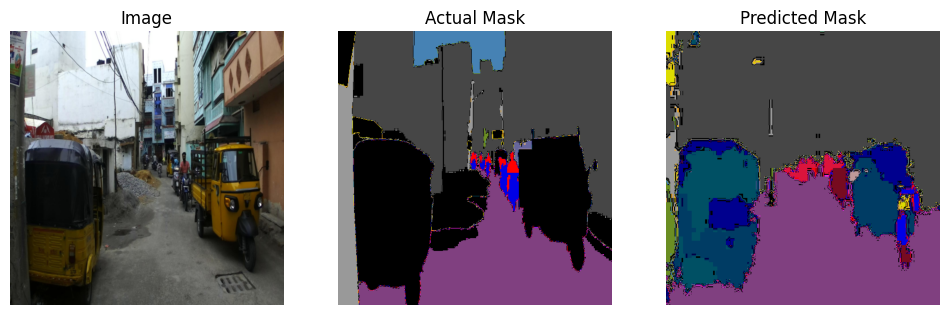

Label: Building


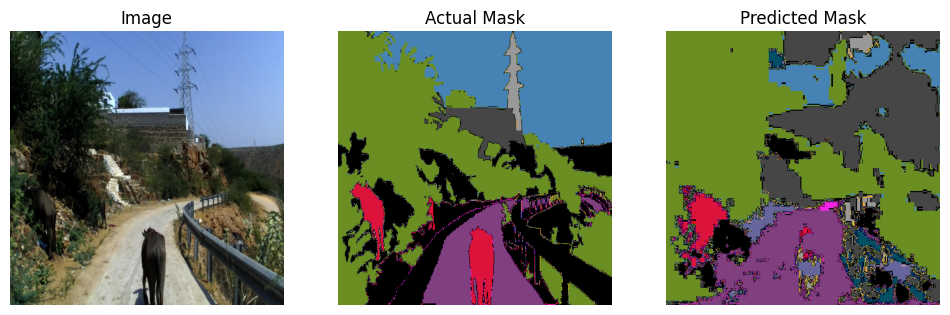

Label: Sky


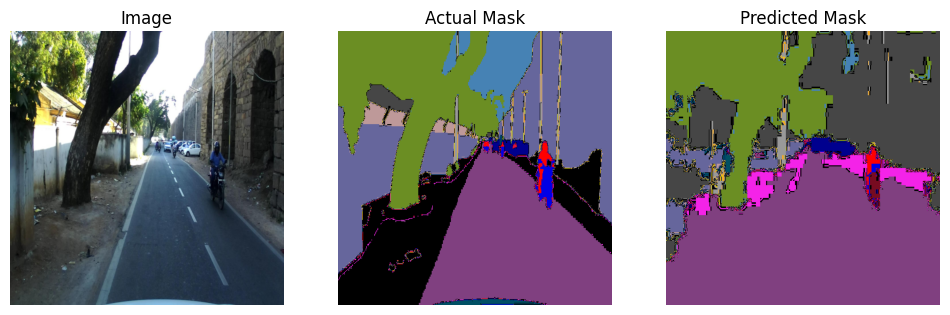

Label: Sky


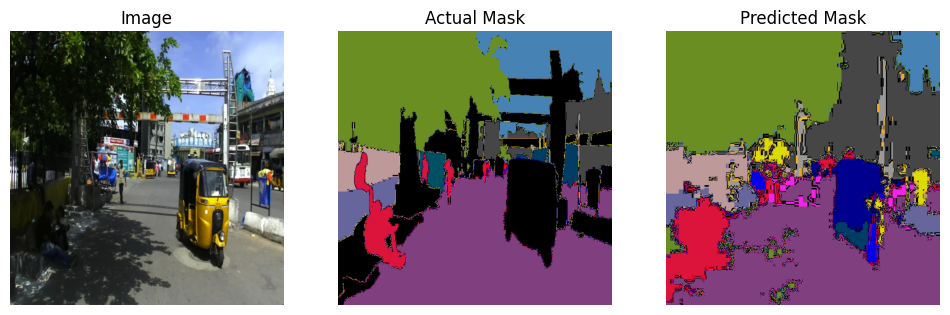

Label: Vegetation


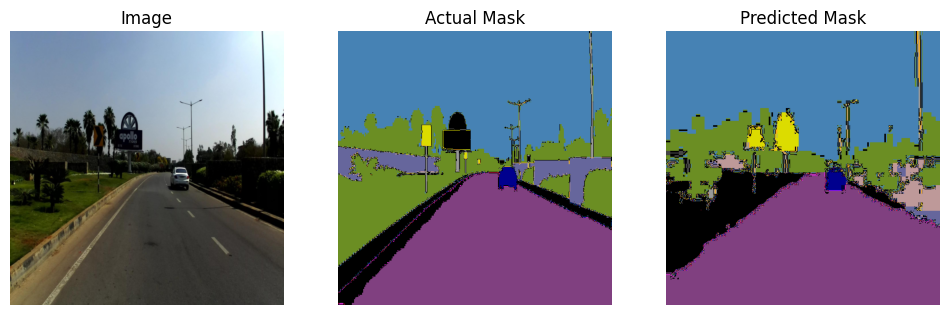

Label: Vegetation


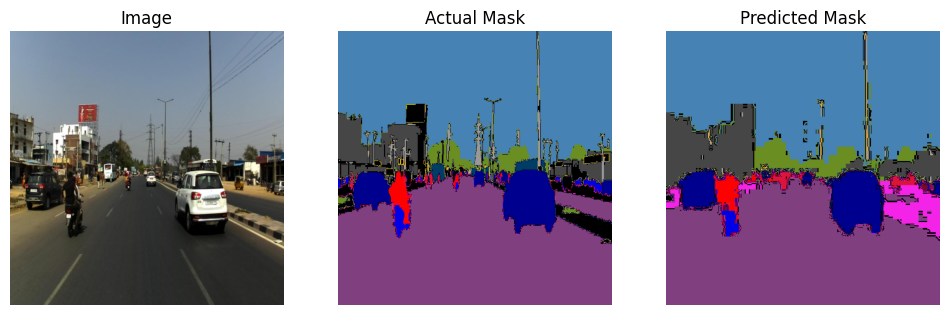

Label: Sky


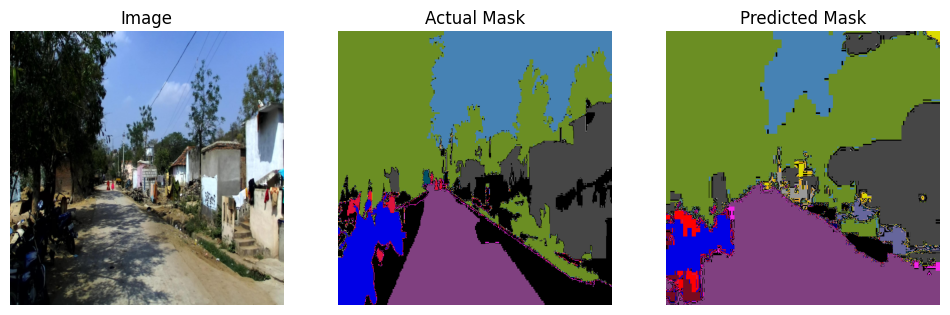

In [57]:
three_lbl = {key: 3 for key in label_map}

for i in range(len(res_data)):
    img, rl_pred_mask = res_data[i]
    _, rl_act_mask = test_data[i]

    pred_mask = np.asarray(rl_pred_mask)
    pred_mask = pred_mask.flatten()

    act_mask = np.asarray(rl_act_mask)
    act_mask = act_mask.flatten()

    tp, tn, fp, fn = 0, 0, 0, 0
    for key in three_lbl:
        tp = sum((act_mask[pred_mask == key] == key) == True)
        fp = sum((act_mask[pred_mask == key] != key) == True)
        fn = sum((pred_mask[act_mask == key] != key) == True)

        iou_val = (tp) / (tp + fp + fn)
        if(iou_val <= 0.5):
            print("Label:",label_map[key])
            img = tf_mask(img)
            three_lbl[key] -= 1

            col_rl = gen_colour_masks(rl_act_mask)
            col_pd = gen_colour_masks(rl_pred_mask)
            plt.figure(figsize=(12, 4))

            plt.subplot(1, 3, 1)
            plt.imshow(img)
            plt.title('Image')
            plt.axis('off')

            plt.subplot(1, 3, 2)
            plt.imshow(col_rl)
            plt.title('Actual Mask')
            plt.axis('off')

            plt.subplot(1, 3, 3)
            plt.imshow(col_pd)
            plt.title('Predicted Mask')
            plt.axis('off')

            plt.show()

            if(three_lbl[key] == 0):
                three_lbl.pop(key)
            
            break
    if(not three_lbl):
        break


In [31]:
confusion_matrix = {key: {k: 0 for k in labels} for key in labels}
lbl_st = set(labels)
for i in tqdm(range(len(res_data))):
    _, pred_mask = res_data[i]
    _, act_mask = test_data[i]

    pred_mask = np.asarray(pred_mask).flatten()
    act_mask = np.asarray(act_mask).flatten()

    for key in labels:
        misclassified_samples = act_mask[pred_mask == key]
        r1 = set(misclassified_samples) 
        for misclass in (set(misclassified_samples)):
            if(misclass in lbl_st):
                confusion_matrix[key][misclass] += np.sum(misclassified_samples == misclass)

100%|██████████| 2095/2095 [01:31<00:00, 22.86it/s]


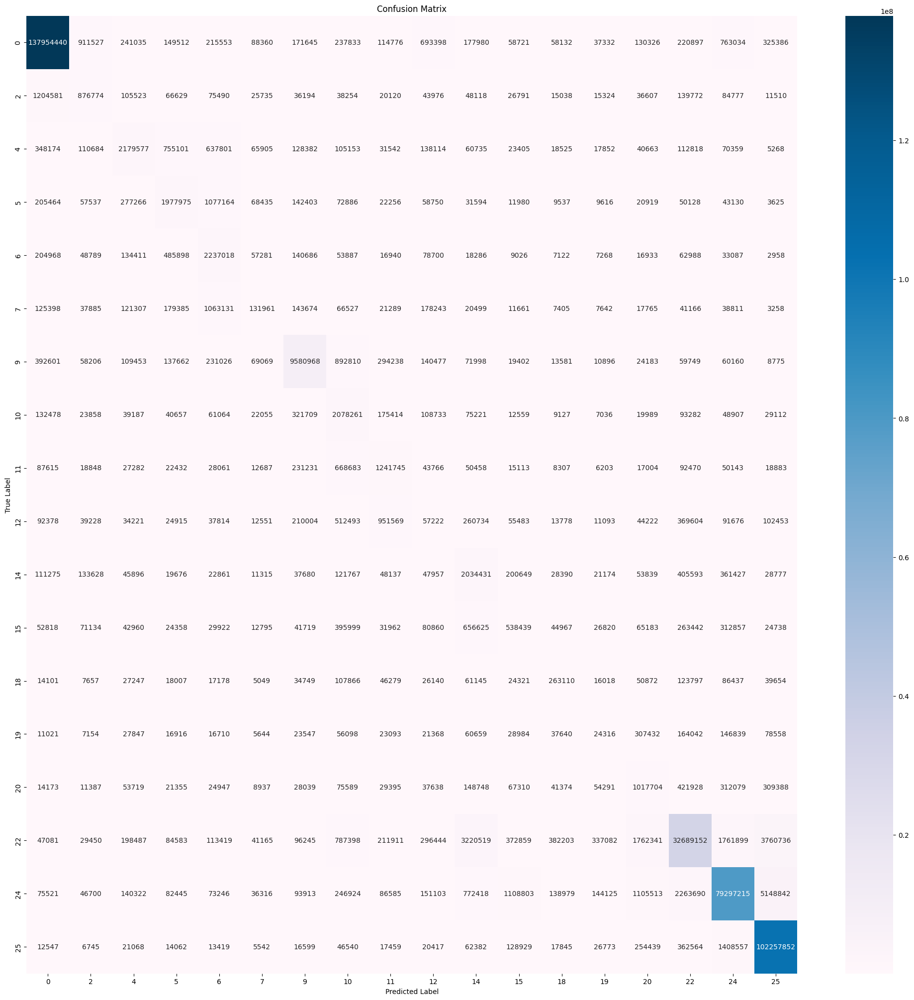

In [58]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

confusion_matrix_array = np.array([[confusion_matrix[key][k] for k in labels] for key in labels])

plt.figure(figsize=(25, 25))
sns.heatmap(confusion_matrix_array, annot=True, cmap='PuBu', fmt='d', xticklabels=labels, yticklabels=labels)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix')
plt.show()